In [1]:
import numpy as np
import open3d as o3d
import numpy as np
import plotly.graph_objs as go
from plotly.offline import plot
from IPython.display import display
import torch.nn as nn
import os
from torch.utils.data import Dataset, DataLoader
import torch

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
torch.cuda.is_available()

True

In [3]:
class ImageMapsDataset(Dataset):
    def __init__(self, images_path, points_path=None):
        super().__init__()
        self.images_path = images_path
        self.points_path = points_path
        

    def __len__(self):
        return (len(os.listdir(self.images_path)) - 2) * 10
    
    def _prepare_map(self, points):
        x = points[:, 0]
        y = points[:, 2]

        x = ((x - x.min())/(x.max() - x.min())) * 319 / 2 + 80
        x = x.astype(np.int16)

        y = ((y - y.min())/(y.max() - y.min())) * 239 / 2 + 90
        y = y.astype(np.int16)

        pic = np.ones((240, 320))

        pic[-y, x] = np.zeros(len(y))
        
        return pic
    

    def __getitem__(self, index):
        i = index // 10
        j = index % 10
        
        data = np.load(f'{self.images_path}/map{i+1}_data.npz')
        
        points = np.asarray(o3d.io.read_point_cloud(f"{self.points_path}/map{i+1}_{j}.ply").points)
        points_padded = np.zeros((6000, 3))
        n = points.shape[0]
        left_shift = (6000 - n) // 2
        right_shift = left_shift + (6000 - n) % 2
        points_padded[left_shift:6000-right_shift, :] = points
        points_padded = torch.from_numpy(points_padded.T).to(torch.float32)
        
        im = data['images'][0,j,0]
        map = data['maps'][0,j,0]

        im = torch.from_numpy(im) / 255
        im = im.permute(0, 3, 1, 2)

        map = torch.from_numpy(map[:, :, 0]).unsqueeze(0) / 255
        points_map = torch.from_numpy(self._prepare_map(points)).unsqueeze(0).to(torch.float32)
        
        return im, points_map, points_map

        


        
images_path = "./data/maps_1key_noaug/processed"
points_path = "./data/point_clouds/point_clouds11"
train_dataset = ImageMapsDataset(images_path, points_path)
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=2)


In [4]:
data = np.load(f'./data/maps_1key_noaug/processed/map{99}_data.npz', allow_pickle=True)

d1 = data['maps']
d2 = data['images']
d4 = data['depth']

In [5]:
import numpy as np
import open3d as o3d
import numpy as np
import plotly.graph_objs as go
from plotly.offline import plot
from IPython.display import display



# Function to create a transformation matrix from rotation and translation
def create_transformation_matrix(rotation, translation):
    transformation = np.eye(4)
    transformation[:3, :3] = rotation  # Assign rotation
    transformation[:3, 3] = translation  # Assign translation
    return transformation

# Function to transform a point cloud using a transformation matrix
def transform_point_cloud(pcd, transformation):
    pcd.transform(transformation)  # Apply the 4x4 transformation
    return pcd
# Load the point cloud from the uploaded .ply file
pcd = o3d.io.read_point_cloud("./data/point_clouds/point_clouds11/map99_1.ply")
points = np.asarray(pcd.points)

# Optionally, downsample the points for faster rendering
sample_rate = 20000  # Adjust as needed
if len(points) > sample_rate:
    indices = np.random.choice(len(points), sample_rate, replace=False)
    sampled_points = points[indices]
else:
    sampled_points = points

# Create Plotly scatter plot
scatter = go.Scatter3d(
    x=sampled_points[:, 0],
    y=sampled_points[:, 1],
    z=sampled_points[:, 2],
    mode='markers',
    marker=dict(
        size=1,
        color=sampled_points[:, 2],
        colorscale='Viridis',
        opacity=0.8
    )
)

layout = go.Layout(
    title='3D Point Cloud Visualization',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig = go.Figure(data=[scatter], layout=layout)
fig.show()

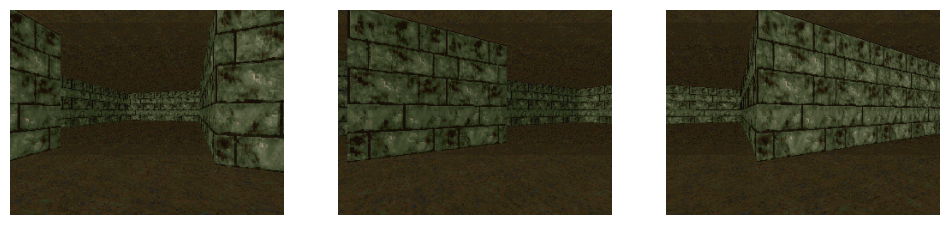

In [6]:
import matplotlib.pyplot as plt

n1 = 1

fig, ax = plt.subplots(ncols=3, figsize=(12, 4))
ax[0].imshow(d2[0, n1, 0 ,0])
ax[0].set_axis_off()
ax[1].imshow(d2[0, n1, 0 ,1])
ax[1].set_axis_off()
ax[2].imshow(d2[0, n1, 0 ,2])
ax[2].set_axis_off()

plt.savefig("./doomview3.png", dpi=200, bbox_inches='tight')

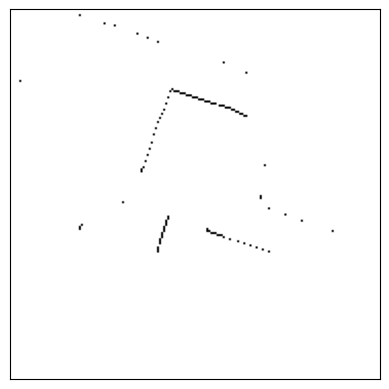

In [7]:
fig, ax = plt.subplots()

ax.imshow(d1[0,n1,0,:,:,])
plt.xlim(70, 250)
plt.ylim(180, 0)
ax.set_xticks([])
ax.set_yticks([])
plt.savefig("./doom_map.png", dpi=200, bbox_inches='tight')

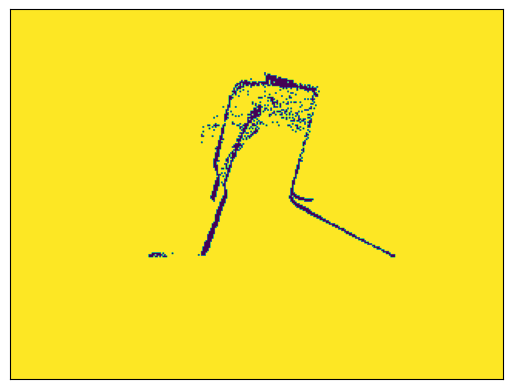

In [8]:
x = sampled_points[:, 0]
y = sampled_points[:, 2]

x = ((x - x.min())/(x.max() - x.min())) * 319 / 2 + 90
x = x.astype(np.int16)

y = ((y - y.min())/(y.max() - y.min())) * 239 / 2 + 80
y = y.astype(np.int16)

pic = np.ones((240, 320))

pic[-y, x] = np.zeros(len(y))

fig, ax = plt.subplots()
plt.imshow(pic)
ax.set_xticks([])
ax.set_yticks([])

plt.savefig("./doom_cloud.png", dpi=200, bbox_inches='tight')

In [25]:
class EncoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, features):
        super().__init__()    
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 8, 3, padding=1, stride=2), 
            nn.ReLU(),
            nn.BatchNorm2d(8),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(8, 16, 3, padding=1, stride=2), 
            nn.ReLU(),
            nn.BatchNorm2d(16),
            nn.MaxPool2d(2, 2),
            nn.Flatten(1),
            nn.Linear(features, 800),
            nn.ReLU(),
            nn.Linear(800, 400)
        )
        
    def forward(self, x):
        return self.encoder(x)
    
    
class ImagesEncoder(nn.Module):
    def __init__(self, in_channels, out_channels, features):
        super().__init__()    
        self.encoder1 = EncoderBlock(in_channels, out_channels, features)
        self.encoder2 = EncoderBlock(in_channels, out_channels, features)
        self.encoder3 = EncoderBlock(in_channels, out_channels, features)
    def forward(self, x1, x2, x3):
        x1 = self.encoder1(x1)
        x2 = self.encoder2(x2)
        x3 = self.encoder3(x3)
        return x1, x2, x3




class MapGenerator(nn.Module):
    def __init__(self, depth_model=None):
        super().__init__()
        
        self.depth_model = depth_model
        self.resize = Resize((210, 280))

        # self.points_encoder = nn.Sequential(
        #     nn.Conv1d(3, 16, 5, padding=2), # 3 x 6000
        #     nn.ReLU(),
        #     nn.AvgPool1d(2, 2),
        #     nn.Conv1d(16, 32, 3, padding=1), # 16 x 3000
        #     nn.ReLU(),
        #     nn.AvgPool1d(2, 2),
        #     nn.Conv1d(32, 32, 3, padding=1), # 32 x 1500
        #     nn.ReLU(),
        #     nn.AvgPool1d(2, 2), # 32 x 750
        #     nn.Flatten(1),
        #     nn.Linear(24_000, 8_000),
        #     nn.ReLU(),
        #     nn.Linear(8000, 4800)
        # )
        
        self.im_encoder = ImagesEncoder(3, 16, 4_800)
        self.depth_encoder = ImagesEncoder(1, 16, 3_536)
        self.points_encoder = EncoderBlock(1, 16, 4_800)
        
        
        self.make_embedding = nn.Sequential(
            nn.Linear(2400, 4_800),
        )

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(16, 8, kernel_size=2, stride=2),
            nn.Conv2d(8, 8, kernel_size=3, padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(),
            nn.ConvTranspose2d(8, 4, kernel_size=2, stride=2),
            nn.BatchNorm2d(4),
            nn.ReLU(),
            nn.ConvTranspose2d(4, 2, kernel_size=2, stride=2),
            nn.BatchNorm2d(2),
            nn.ReLU(),
            nn.ConvTranspose2d(2, 1, kernel_size=2, stride=2),
        )

    def forward(self, ims, points):
        im1, im2, im3 = ims[:, 0, :], ims[:, 1, :], ims[:, 2, :]
        
        with torch.no_grad():
            d1, d2, d3 = self.depth_model(self.resize(im1)), self.depth_model(self.resize(im2)), self.depth_model(self.resize(im3))
        
        im1, im2, im3 = self.im_encoder(im1, im2, im3)
        d1, d2, d3 = self.depth_encoder(d1.unsqueeze(1), d2.unsqueeze(1), d3.unsqueeze(1))
        
       # points = self.points_encoder(points)
        x = torch.cat([im1, im2, im3, d1, d2, d3], axis=1)
        #points = self.points_encoder(points)
        #points = 0
        
        x = self.make_embedding(x)
        x = x.view(-1, 16, 15, 20)
        x = self.decoder(x)
        return x
    

    


In [10]:
train_loader = DataLoader(train_dataset, shuffle=True, batch_size=2)
ex = None
for b in train_loader:
    ex = b
    break

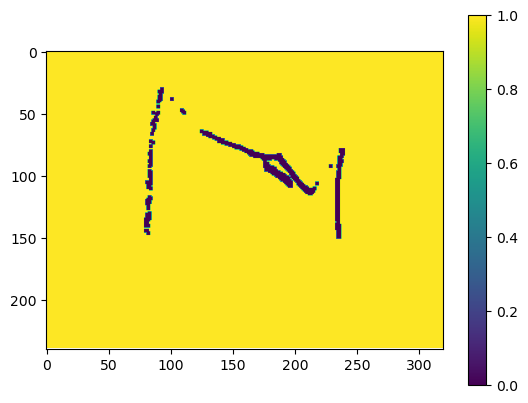

In [11]:
from torchvision.transforms import GaussianBlur
map = ex[-1][0, 0]
gb = GaussianBlur(kernel_size=3, sigma=6)
gb_map = gb(map.view(1, 240, 320))
gb_map = (gb_map - gb_map.min()) / (gb_map.max() - gb_map.min())
gb_map[gb_map<1] = 0
plt.imshow(gb_map[0])
plt.colorbar()

In [12]:
def gauss_pixel_loss(y_true, y_pred, loss_fn):
    EPS = 1e-7
    gb = GaussianBlur(kernel_size=5, sigma=4)
    y_true = gb(y_true)
    y_true = (y_true - y_true.min()) / (y_true.max() - y_true.min() + EPS)
    y_true[y_true < 0.9] = 0
    return loss_fn(y_pred, y_true)

In [13]:
import sys
sys.path.insert(0, "./data/maps_1key_noaug/processed/Depth-Anything-V2")

In [14]:
from depth_anything_v2.dpt import DepthAnythingV2

depth_model = DepthAnythingV2(encoder='vits', features=64, out_channels=[48, 96, 192, 384])
depth_model.load_state_dict(torch.load('./data/maps_1key_noaug/processed/Depth-Anything-V2/depth_anything_v2_vits.pth', map_location='cpu'))
depth_model.eval();

xFormers not available
xFormers not available


In [15]:
from torchvision.transforms import Resize
res = Resize((210, 280))
depth_model(res(ex[0][0])).shape

torch.Size([3, 210, 280])

In [16]:
def dice_loss(pred,target):
    numerator = 2 * torch.sum(pred * target)
    denominator = torch.sum(pred + target)
    return 1 - (numerator + 1) / (denominator + 1)

  0%|          | 0/15 [00:00<?, ?it/s]

tensor(0.5427, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.5255, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.5079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.4905, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


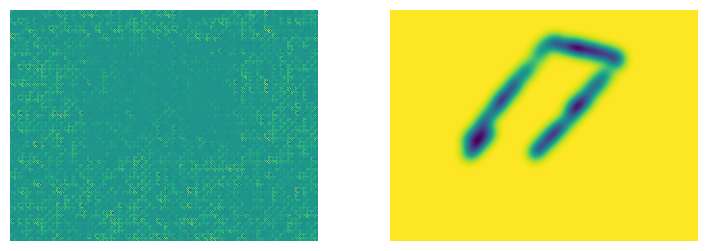

tensor(0.4753, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.4592, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.4445, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.4304, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


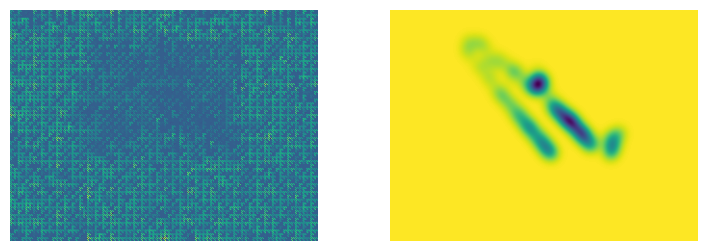

tensor(0.4182, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.4057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.3937, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.3825, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


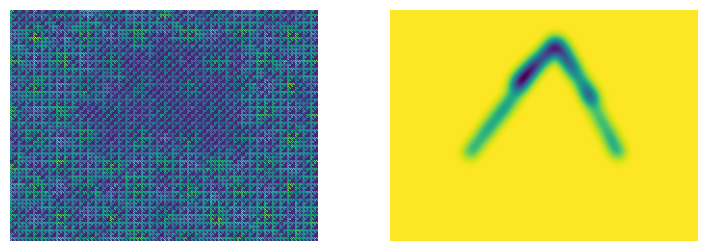

tensor(0.3700, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.3612, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.3504, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.3415, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


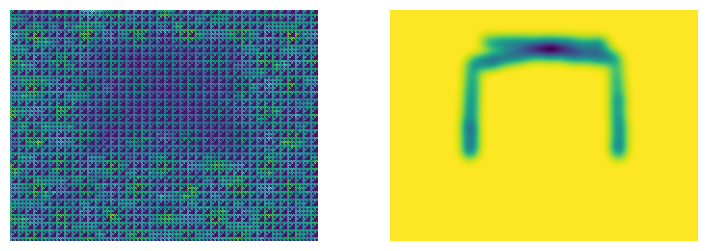

tensor(0.3312, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.3211, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.3143, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.3051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


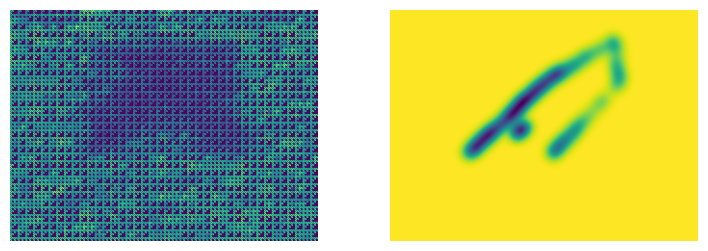

tensor(0.2965, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2904, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2827, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2724, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


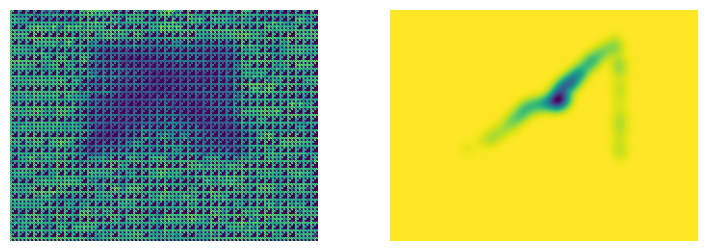

tensor(0.2680, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2600, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2544, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2462, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


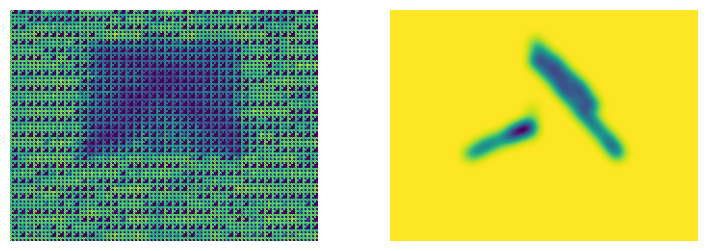

tensor(0.2424, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2359, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2297, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2232, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


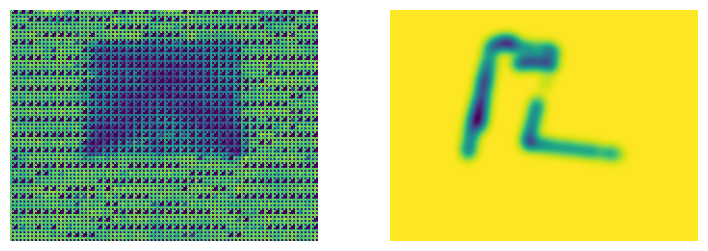

tensor(0.2191, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2150, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2088, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.2051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


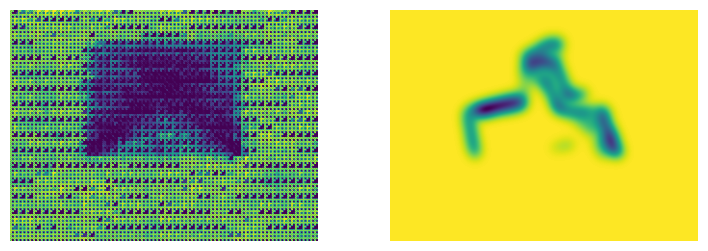

tensor(0.1997, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1959, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1899, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1842, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


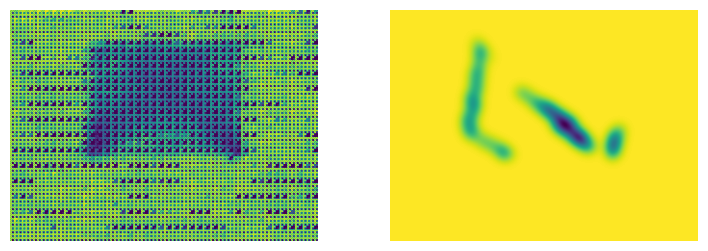

tensor(0.1807, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1720, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1683, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1633, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


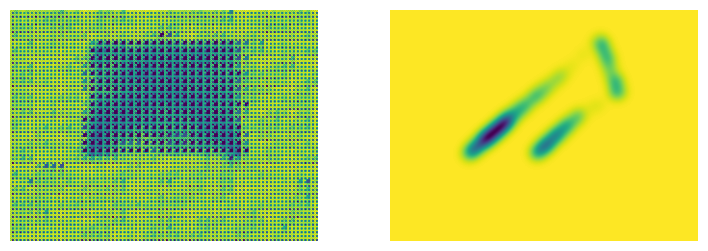

tensor(0.1609, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1542, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1530, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1463, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


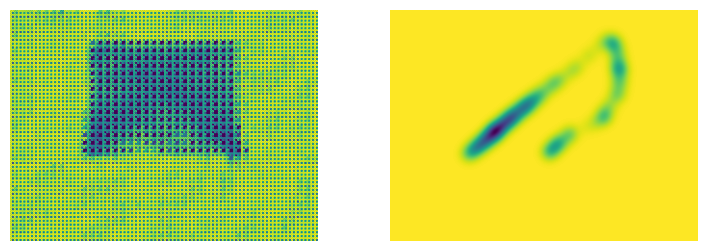

tensor(0.1483, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1403, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1379, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1341, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


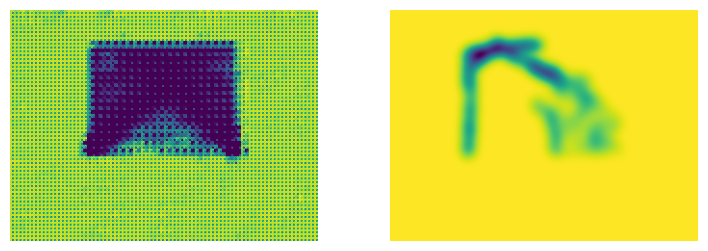

tensor(0.1325, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1305, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1298, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1236, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


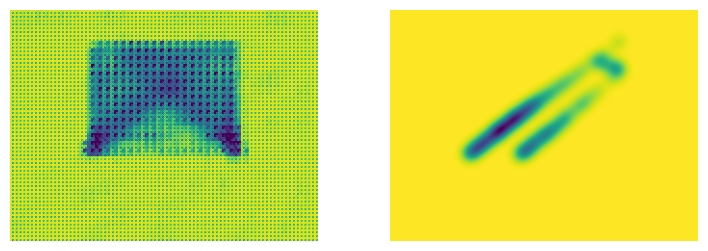

tensor(0.1245, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1203, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1195, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.1155, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)


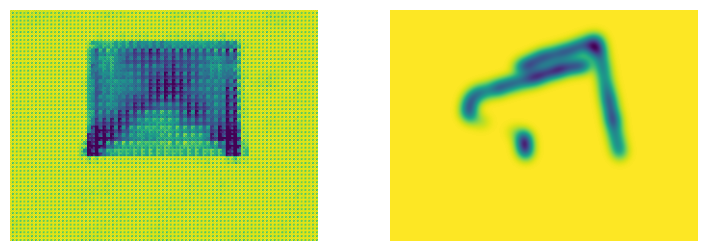

In [26]:
from tqdm.auto import tqdm

torch.cuda.empty_cache()

train_loader = DataLoader(train_dataset, shuffle=True, batch_size=250)
model = MapGenerator(depth_model)
losses = []
max_epoch = 15
device = torch.device('cuda')
loss_fn = nn.BCELoss()

model.to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=2e-2)

gb = GaussianBlur(kernel_size=43, sigma=6)

for _ in tqdm(range(max_epoch)):
    model.train()
    for ims, points, maps in train_loader:
        optimizer.zero_grad()
        ims, points, maps = ims.to(device), points.to(device), maps.to(device)
        output = model(ims,points)
        output = torch.sigmoid(output)
        loss = gauss_pixel_loss(maps, output, loss_fn)
        print(loss)
        loss.backward()
        losses.append(loss.detach().cpu().numpy())
        optimizer.step()

    fig, ax = plt.subplots(ncols=2, figsize=(9, 3))
    ex = torch.sigmoid(output[0].detach().cpu()).numpy()[0]
    mp = gb(maps[0].detach().cpu()).numpy()[0]
    ax[0].imshow(ex)
    ax[0].set_axis_off()
    ax[1].imshow(mp)
    ax[1].set_axis_off()
    plt.show()


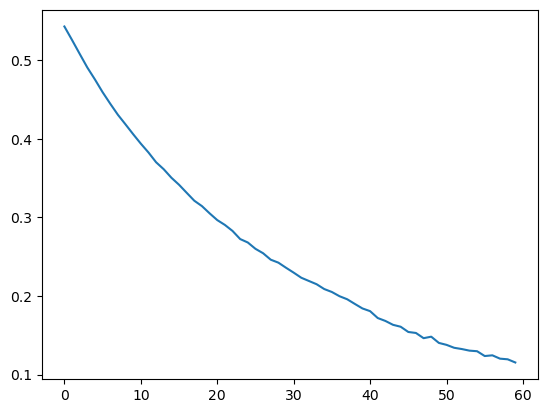

In [27]:
plt.plot(losses)

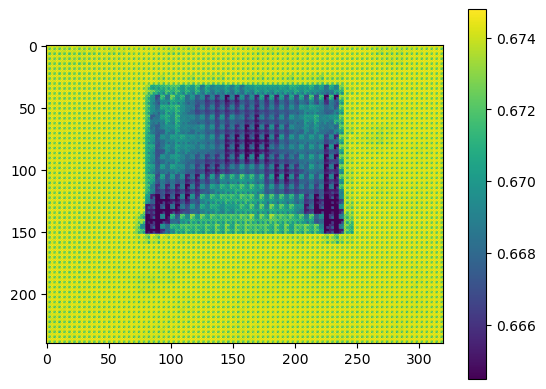

In [28]:
plt.imshow(torch.sigmoid(torch.from_numpy(ex)))
plt.colorbar()

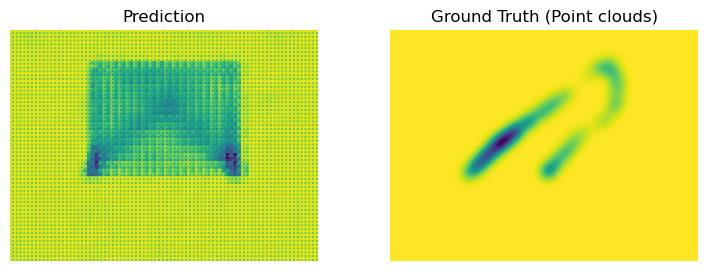

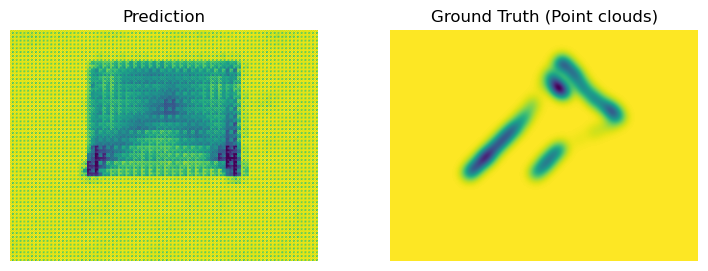

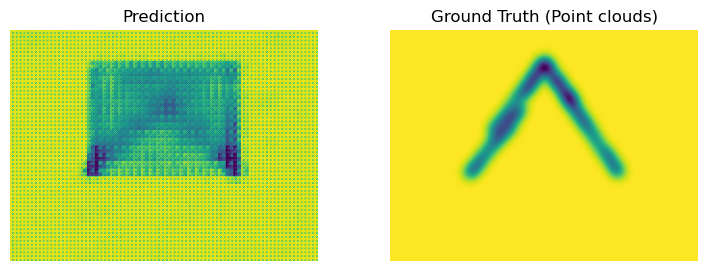

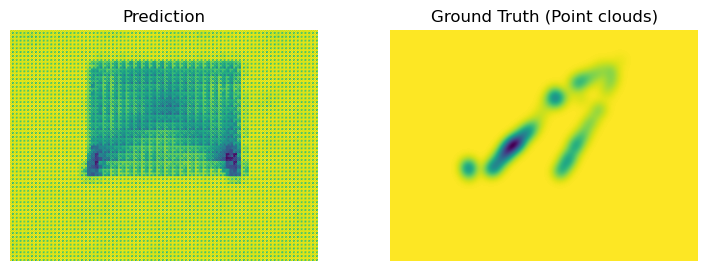

In [29]:
i = 0
for ims, points, maps in train_loader:
    ims, points, maps = ims.to(device), points.to(device), maps.to(device)
    output = model(ims,points)
    
    fig, ax = plt.subplots(ncols=2, figsize=(9, 3))
    ex = torch.sigmoid(output[1].detach().cpu()).numpy()[0]
    mp = gb(maps[1].detach().cpu()).numpy()[0]
    ax[0].imshow(ex)
    ax[0].set_axis_off()
    ax[0].set_title("Prediction")
    ax[1].imshow(mp)
    ax[1].set_axis_off()
    ax[1].set_title("Ground Truth (Point clouds)")
    plt.show()
    
    i += 1
    if i > 10:
        break

In [21]:
torch.allclose(output[0], output[2], atol=0.2)

True

In [22]:
?torch.allclose

Docstring:
allclose(input, other, rtol=1e-05, atol=1e-08, equal_nan=False) -> bool

This function checks if all :attr:`input` and :attr:`other` satisfy the condition:

.. math::
    \lvert \text{input} - \text{other} \rvert \leq \texttt{atol} + \texttt{rtol} \times \lvert \text{other} \rvert

elementwise, for all elements of :attr:`input` and :attr:`other`. The behaviour of this function is analogous to
`numpy.allclose <https://docs.scipy.org/doc/numpy/reference/generated/numpy.allclose.html>`_

Args:
    input (Tensor): first tensor to compare
    other (Tensor): second tensor to compare
    atol (float, optional): absolute tolerance. Default: 1e-08
    rtol (float, optional): relative tolerance. Default: 1e-05
    equal_nan (bool, optional): if ``True``, then two ``NaN`` s will be considered equal. Default: ``False``

Example::

    >>> torch.allclose(torch.tensor([10000., 1e-07]), torch.tensor([10000.1, 1e-08]))
    False
    >>> torch.allclose(torch.tensor([10000., 1e-08]), torch.t